#Connect To Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
directory = '/content/drive/MyDrive/SEIS 766 Final Project Dataset'
real_images_path = '/content/drive/MyDrive/SEIS 766 Final Project Dataset/real'
fake_images_path = '/content/drive/MyDrive/SEIS 766 Final Project Dataset/fake'

#Import Library Modules

In [ ]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import resnet18

from PIL import Image, ImageFile, UnidentifiedImageError

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from graphviz import Digraph
from IPython.display import display

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_curve, auc
)

!pip install piq
import piq

!pip install optuna
import optuna


#Unnormalization

In [ ]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

def unnormalize(imgs, mean, std):
    mean = torch.tensor(mean, device=imgs.device).view(1, 3, 1, 1)
    std = torch.tensor(std, device=imgs.device).view(1, 3, 1, 1)
    return imgs * std + mean

#Dataset Processing


In [ ]:
# Define a transform to resize the images and convert to tensors
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize to a fixed size
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)  # Normalize using ImageNet statistics
])

def sample_images_from_directory(directory, sample_fraction, seed=42):
    all_images = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(('jpg', 'jpeg', 'png'))]
    sample_size = int(sample_fraction * len(all_images))
    random.seed(seed)
    return random.sample(all_images, sample_size)

class RealFakeDataset(Dataset):
    def __init__(self, real_dir, fake_dir, transform=None, sample_fraction=1, seed=42):
        self.real_images = sample_images_from_directory(real_dir, sample_fraction, seed)
        self.fake_images = sample_images_from_directory(fake_dir, sample_fraction, seed)
        self.transform = transform
        self.images = self.real_images + self.fake_images
        self.labels = [1] * len(self.real_images) + [0] * len(self.fake_images)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        label = float(self.labels[idx])  # Make it float for BCELoss
        try:
            image = Image.open(img_path)
            if image.mode == "P":
                image = image.convert("RGBA")
            image = image.convert("RGB")
            if self.transform:
                image = self.transform(image)
            return image, label
        except (UnidentifiedImageError, OSError) as e:
            print(f"Error loading image {img_path}: {e}")
            return torch.zeros(3, 256, 256), -1.0

#Show Samples

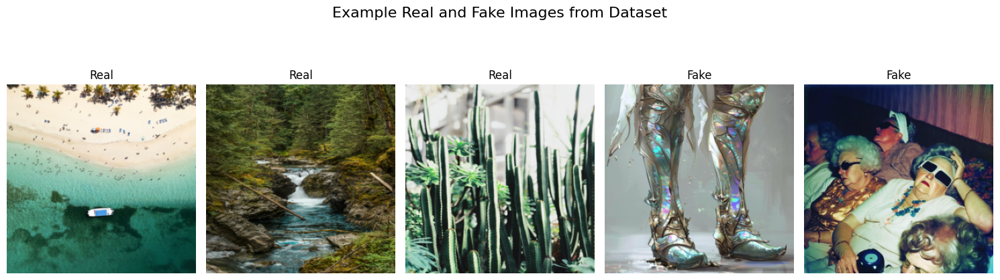

In [ ]:
def show_real_and_fake_examples(real_dir, fake_dir, num_real=3, num_fake=2, transform=None, mean=None, std=None):
    # Collect image file paths
    real_images = [os.path.join(real_dir, f) for f in os.listdir(real_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
    fake_images = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]

    # Sample requested number of images
    real_sampled = random.sample(real_images, num_real)
    fake_sampled = random.sample(fake_images, num_fake)

    image_paths = real_sampled + fake_sampled
    labels = ['Real'] * num_real + ['Fake'] * num_fake

    images = []

    # Load and transform each image, handling potential errors
    for path in image_paths:
        try:
            img = Image.open(path).convert('RGB')
            if transform:
                img = transform(img)
            else:
                img = transforms.ToTensor()(img)
            images.append(img)
        except OSError as e:
            print(f"Skipping corrupted image: {path} due to error: {e}")

    # Stack into batch
    images_tensor = torch.stack(images).to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))

    # Unnormalize
    if mean is not None and std is not None:
        images_tensor = unnormalize(images_tensor, mean, std)

    images_tensor = torch.clamp(images_tensor, 0, 1)

    # Plot
    fig, axs = plt.subplots(1, len(images_tensor), figsize=(15, 5))
    for i, (img, label) in enumerate(zip(images_tensor, labels)):
        axs[i].imshow(img.permute(1, 2, 0).cpu().numpy())
        axs[i].axis("off")
        axs[i].set_title(label)

    plt.suptitle("Example Real and Fake Images from Dataset", fontsize=16)
    plt.tight_layout()
    plt.show()

show_real_and_fake_examples(
    real_dir=real_images_path,
    fake_dir=fake_images_path,
    transform=transform,
    mean=IMAGENET_MEAN,
    std=IMAGENET_STD
)

#AutoencoderClassifier

In [ ]:
class AutoencoderClassifier(nn.Module):
    def __init__(self, freeze_encoder=False):
        super(AutoencoderClassifier, self).__init__()

        # Load ResNet18 pretrained model
        base_model = resnet18(pretrained=True)

        # Keep features up to layer3 (preserve spatial resolution)
        self.encoder = nn.Sequential(
            base_model.conv1,   # -> [B, 64, 128, 128]
            base_model.bn1,
            base_model.relu,
            base_model.maxpool, # -> [B, 64, 64, 64]
            base_model.layer1,  # -> [B, 64, 64, 64]
            base_model.layer2,  # -> [B, 128, 32, 32]
            base_model.layer3   # -> [B, 256, 16, 16]
        )

        # Freezing the encoder if freeze_encoder is True
        if freeze_encoder:
            for param in self.encoder.parameters():
                param.requires_grad = False

        # Decoder
        self.decoder = nn.Sequential(
          nn.ConvTranspose2d(256, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.ReLU(),
          nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.BatchNorm2d(64), nn.ReLU(),
          nn.ConvTranspose2d(64, 32, 4, 2, 1), nn.BatchNorm2d(32), nn.ReLU(),
          nn.ConvTranspose2d(32, 16, 4, 2, 1), nn.BatchNorm2d(16), nn.ReLU(),
          nn.Conv2d(16, 3, kernel_size=3, padding=1), nn.Sigmoid()
      )

        # Global average pooling for classification
        self.classifier = nn.Sequential(
          nn.AdaptiveAvgPool2d((1, 1)),
          nn.Flatten(),
          nn.Linear(256, 128),
          nn.ReLU(),
          nn.Dropout(0.3),
          nn.Linear(128, 1),
          nn.Sigmoid()
      )

    def forward(self, x):
        encoded = self.encoder(x)              # [B, 256, 16, 16]
        reconstructed = self.decoder(encoded)  # [B, 3, 256, 256]
        classification = self.classifier(encoded)  # [B, 1]
        return reconstructed, classification


#Threshold (From Previous Training)

In [ ]:
threshold = 0.5581

#Visualization Of Reconstruction

In [ ]:
def visualize_reconstruction(model, test_loader, threshold=0.5, num_images=16):
    model.eval()
    device = next(model.parameters()).device

    with torch.no_grad():
        images, labels = next(iter(test_loader))  # Get a batch of images and labels
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass through the model
        reconstructions, class_outputs = model(images)

        # Convert predictions to binary labels
        pred_labels = (class_outputs > threshold).float()

        # Denormalize the images and reconstructions
        images = unnormalize(images, IMAGENET_MEAN, IMAGENET_STD)  # ✅ only for real images
        reconstructions = torch.clamp(reconstructions, 0.0, 1.0)
        images = torch.clamp(images, 0.0, 1.0)

        # Set up the figure with 2 rows (original on top, reconstructed on bottom)
        fig, axs = plt.subplots(2, min(num_images, images.size(0)), figsize=(15, 5))
        axs = axs.flatten()

        for i in range(min(num_images, images.size(0))):
            orig_img = images[i].cpu()
            recon_img = reconstructions[i].cpu()
            gt = int(labels[i].item())  # True label (Ground Truth)
            pred = int(pred_labels[i].item())  # Predicted label

            # Original image with true label (Ground Truth)
            axs[i].imshow(orig_img.permute(1, 2, 0))
            axs[i].set_title(f"{'Real' if gt == 1 else 'Fake'}")
            axs[i].axis("off")

            # Reconstructed image with predicted label (this goes in the second row)
            axs[i + len(images)].imshow(recon_img.permute(1, 2, 0))
            axs[i + len(images)].set_title(f"{'Real' if pred == 1 else 'Fake'}")
            axs[i + len(images)].axis("off")

        # Add a title at the top of the plot
        plt.suptitle("Originals (Top) vs Reconstructions (Bottom)\nwith Ground Truth and Predicted Labels")
        plt.tight_layout()
        plt.show()

        print("Recon output stats:",
        f"min={reconstructions.min().item():.3f}, max={reconstructions.max().item():.3f}, mean={reconstructions.mean().item():.3f}")


#Hybrid Loss

In [ ]:
class FullHybridLoss(nn.Module):
    def __init__(self, alpha=0.84, beta=0.15, gamma=1.0, mean=IMAGENET_MEAN, std=IMAGENET_STD): # Add mean and std
        super(FullHybridLoss, self).__init__()
        self.l1 = nn.L1Loss()
        self.ssim_func = piq.ssim
        self.lpips = piq.LPIPS(replace_pooling=True)
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.mean = mean  # Store mean
        self.std = std  # Store std

    def forward(self, output, target):
        output_unnorm = unnormalize(output, self.mean, self.std) # Pass mean and std
        target_unnorm = unnormalize(target, self.mean, self.std) # Pass mean and std
        l1_loss = self.l1(output_unnorm, target_unnorm)
        ssim_loss = 1 - self.ssim_func(output_unnorm, target_unnorm, data_range=1.0)
        perceptual_loss = self.lpips(output_unnorm, target_unnorm)
        return self.alpha * l1_loss + self.beta * ssim_loss + self.gamma * perceptual_loss

#Focal Loss

In [ ]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2.0, alpha=0.25):
        super().__init__()
        self.gamma = gamma
        self.alpha = alpha

    def forward(self, preds, targets):
        eps = 1e-8
        preds = preds.clamp(min=eps, max=1.0 - eps)
        bce_loss = -(
            self.alpha * targets * torch.log(preds) +
            (1 - self.alpha) * (1 - targets) * torch.log(1 - preds)
        )
        pt = torch.where(targets == 1, preds, 1 - preds)
        focal_term = (1 - pt) ** self.gamma
        return (focal_term * bce_loss).mean()


#Save Checkpoints

In [ ]:
import os

checkpoint_dir = '/content/drive/MyDrive/SEIS 766 Final Project Dataset/checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

def save_checkpoint(model, optimizer, epoch, loss, checkpoint_dir):
    checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch+1}.pth')
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }, checkpoint_path)
    print(f"Checkpoint saved at {checkpoint_path}")


In [ ]:
def load_checkpoint(model, optimizer, checkpoint_dir):
    checkpoint_files = os.listdir(checkpoint_dir)
    if len(checkpoint_files) > 0:
        latest_checkpoint = max(checkpoint_files, key=lambda x: int(x.split('_')[2].split('.')[0]))  # Get the latest checkpoint file
        checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)
        checkpoint = torch.load(checkpoint_path)

        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint['epoch'] + 1
        print(f"Resuming from checkpoint: {checkpoint_path}")
        return start_epoch, checkpoint['loss']
    else:
        print("No checkpoint found, starting from scratch.")
        return 0, None


#Training Model

In [ ]:
# Training function with checkpoint save and resume
def train_multitask_model(model, train_loader, recon_criterion, class_criterion, optimizer,
                          recon_weight=1.0, class_weight=1.0, epochs=50, visualize_interval=10, freeze_loss=25, checkpoint_dir='/content/drive/MyDrive/your_project/checkpoints'):

    # Mount Google Drive
    drive.mount('/content/drive')
    os.makedirs(checkpoint_dir, exist_ok=True)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.train()

    # Load checkpoint if available
    start_epoch, _ = load_checkpoint(model, optimizer, checkpoint_dir)

    print("Visualizing reconstructions before training starts...")
    visualize_reconstruction(model, test_loader, threshold)

    for epoch in range(start_epoch, epochs):  # Start from the loaded epoch
        print(f"\nEpoch {epoch+1}/{epochs}")
        running_total_loss = 0.0
        running_recon_loss = 0.0
        running_class_loss = 0.0

        # Progressive class weight (0 → class_weight after freeze_loss)
        if epoch < freeze_loss:
            progressive_class_weight = 0.0
        else:
            progress = (epoch - freeze_loss) / (epochs - freeze_loss)
            progressive_class_weight = class_weight * min(progress, 1.0)

        print(f"Using Progressive Class Weight: {progressive_class_weight:.4f}")

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.float().to(device)

            optimizer.zero_grad()
            recon_out, class_out = model(images)

            # Before computing loss, clamp reconstructions
            recon_out = torch.clamp(recon_out, 0.0, 1.0)

            # Prepare images for loss computation (denormalize)
            images_vis = (images * torch.tensor(IMAGENET_STD).view(1, 3, 1, 1).to(images.device)) + \
                         torch.tensor(IMAGENET_MEAN).view(1, 3, 1, 1).to(images.device)
            images_vis = torch.clamp(images_vis, 0.0, 1.0)

            # Compute the reconstruction and classification losses
            loss_recon = recon_criterion(recon_out, images_vis)
            loss_class = class_criterion(class_out.view(-1), labels.view(-1))

            loss = recon_weight * loss_recon + progressive_class_weight * loss_class
            loss.backward()
            optimizer.step()

            running_total_loss += loss.item()
            running_recon_loss += loss_recon.item()
            running_class_loss += loss_class.item()

        # Print the average losses for this epoch
        print(f"Total Loss:      {running_total_loss / len(train_loader):.4f}")
        print(f" - Recon Loss:   {running_recon_loss / len(train_loader):.4f}")
        print(f" - Class Loss:   {running_class_loss / len(train_loader):.4f}")

        # Save checkpoint at the end of the epoch
        save_checkpoint(model, optimizer, epoch, running_total_loss, checkpoint_dir)

        # Visualize the reconstruction every `visualize_interval` epochs
        if (epoch + 1) % visualize_interval == 0:
            visualize_reconstruction(model, test_loader, threshold)

#Setup Optuna Training Parameters (From Previous Run)

In [ ]:
#Training Arguments
sample_fraction = 0.05
epochs = 10
batch_size = 16
lr = 0.0003
weight_decay = 1e-4

#Loss Weighting
recon_weight = 0.64
class_weight = 0.26
freeze_loss = epochs // 10

#Reconstruction Loss Arguments
alpha_r = 0.82
beta = 0.23
gamma_r = 1.46

#Classification Loss Arguments
gamma_c = 3.10
alpha_c = 0.55

In [ ]:
# Setup dataset
Image.MAX_IMAGE_PIXELS = None
ImageFile.LOAD_TRUNCATED_IMAGES = True

dataset = RealFakeDataset(real_images_path, fake_images_path, transform, sample_fraction = sample_fraction)
total_samples = len(dataset)
print(f"Total number of images in the sampled dataset: {total_samples}")

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size= batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size= batch_size, shuffle=False, num_workers=4)

Total number of images in the sampled dataset: 600


#Optuna Optimization Test

In [ ]:
def objective(trial):
    # Reconstruction loss (FullHybridLoss)
    alpha_r = trial.suggest_float("alpha_r", 0.5, 1.0)
    beta = trial.suggest_float("beta", 0.0, 0.5)
    gamma_r = trial.suggest_float("gamma_r", 0.5, 1.5)

    # Classification loss (FocalLoss)
    gamma_c = trial.suggest_float("gamma_c", 0.5, 5.0)
    alpha_c = trial.suggest_float("alpha_c", 0.1, 0.9)

    # Class Weighting
    class_weight = trial.suggest_float("class_weight", 0.1, 0.5)
    recon_weight = 1-class_weight

    model = AutoencoderClassifier(freeze_encoder=True).to("cuda")

    # Unfreeze ResNet layer 2,3,4
    for name, module in model.encoder.named_children():
        if name in ['5', '6', '7']:
            for param in module.parameters():
                param.requires_grad = True

    # Set loss functions with trial parameters
    recon_criterion = FullHybridLoss(alpha=alpha_r, beta=beta, gamma=gamma_r)
    class_criterion = FocalLoss(gamma=gamma_c, alpha=alpha_c)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    train_multitask_model(
        model,
        train_loader,
        recon_criterion,
        class_criterion,
        optimizer,
        recon_weight=recon_weight,
        class_weight=class_weight,
        epochs=epochs,
        visualize_interval=999,  # Skip visualization
        freeze_loss=freeze_loss
    )

    model.eval()
    preds, targets = [], []
    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to("cuda")
            labels = labels.to("cuda")
            _, outputs = model(imgs)
            preds.extend((outputs.view(-1) > 0.4293).cpu().numpy())
            targets.extend(labels.cpu().numpy())

    # Metric to maximize
    return f1_score(targets, preds)


[I 2025-04-21 21:03:30,094] A new study created in memory with name: no-name-336ccd86-d1a0-444e-8a18-a4ddef5ae7d9


Visualizing reconstructions before training starts...


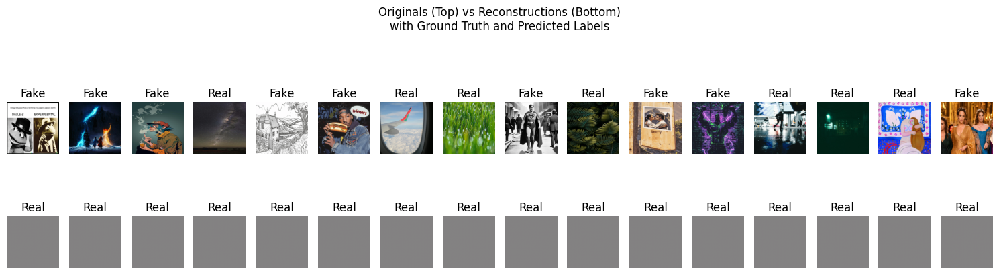

Recon output stats: min=0.507, max=0.520, mean=0.513

Epoch 1/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.2642
 - Recon Loss:   0.2940
 - Class Loss:   0.1821

Epoch 2/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.2612
 - Recon Loss:   0.2906
 - Class Loss:   0.1849

Epoch 3/10
Using Progressive Class Weight: 0.0113
Total Loss:      0.2534
 - Recon Loss:   0.2798
 - Class Loss:   0.1720

Epoch 4/10
Using Progressive Class Weight: 0.0225
Total Loss:      0.2469
 - Recon Loss:   0.2705
 - Class Loss:   0.1697

Epoch 5/10
Using Progressive Class Weight: 0.0338
Total Loss:      0.2422
 - Recon Loss:   0.2634
 - Class Loss:   0.1619

Epoch 6/10
Using Progressive Class Weight: 0.0450
Total Loss:      0.2402
 - Recon Loss:   0.2590
 - Class Loss:   0.1659

Epoch 7/10
Using Progressive Class Weight: 0.0563
Total Loss:      0.2357
 - Recon Loss:   0.2534
 - Class Loss:   0.1416

Epoch 8/10
Using Progressive Class Weight: 0.0675
Total Loss:      0.2330
 - Recon Lo

[I 2025-04-21 21:14:28,349] Trial 0 finished with value: 0.5 and parameters: {'alpha_r': 0.6344611574286323, 'beta': 0.16629500468768138, 'gamma_r': 0.5349147586345588, 'gamma_c': 0.9125131836008086, 'alpha_c': 0.3672973828445977, 'class_weight': 0.10128090644136818}. Best is trial 0 with value: 0.5.
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: U

Visualizing reconstructions before training starts...


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


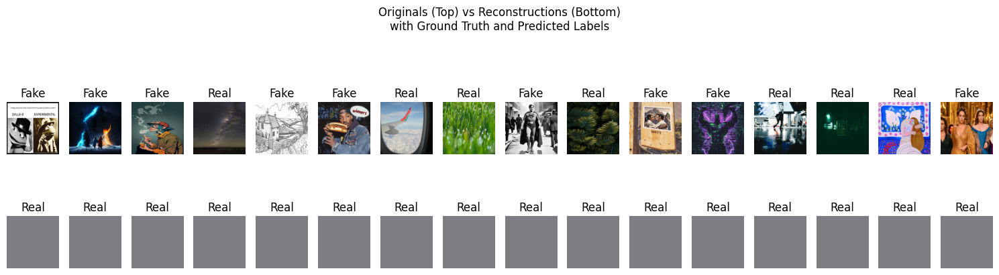

Recon output stats: min=0.491, max=0.521, mean=0.502

Epoch 1/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.4371
 - Recon Loss:   0.6607
 - Class Loss:   0.0973

Epoch 2/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.4357
 - Recon Loss:   0.6586
 - Class Loss:   0.0956

Epoch 3/10
Using Progressive Class Weight: 0.0376
Total Loss:      0.4163
 - Recon Loss:   0.6240
 - Class Loss:   0.0927

Epoch 4/10
Using Progressive Class Weight: 0.0752
Total Loss:      0.4003
 - Recon Loss:   0.5948
 - Class Loss:   0.0905

Epoch 5/10
Using Progressive Class Weight: 0.1128
Total Loss:      0.3906
 - Recon Loss:   0.5763
 - Class Loss:   0.0832

Epoch 6/10
Using Progressive Class Weight: 0.1504
Total Loss:      0.3843
 - Recon Loss:   0.5635
 - Class Loss:   0.0767

Epoch 7/10
Using Progressive Class Weight: 0.1881
Total Loss:      0.3778
 - Recon Loss:   0.5511
 - Class Loss:   0.0705

Epoch 8/10
Using Progressive Class Weight: 0.2257
Total Loss:      0.3721
 - Recon Lo

[I 2025-04-21 21:22:50,911] Trial 1 finished with value: 0.7102803738317757 and parameters: {'alpha_r': 0.6381604840030985, 'beta': 0.08575610033486597, 'gamma_r': 1.4144493250197454, 'gamma_c': 1.897547662399899, 'alpha_c': 0.6156598365263968, 'class_weight': 0.3385076014007039}. Best is trial 1 with value: 0.7102803738317757.
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torchvi

Visualizing reconstructions before training starts...


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


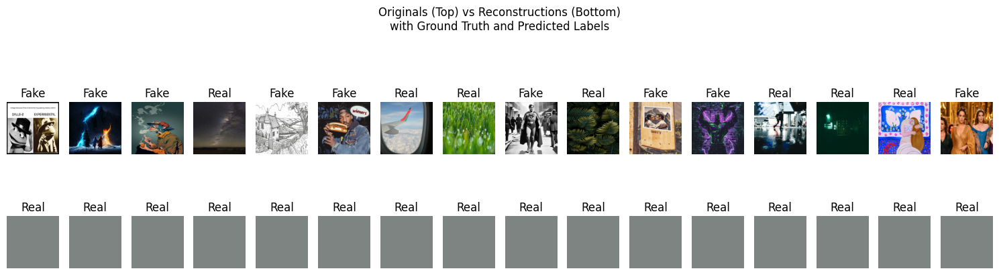

Recon output stats: min=0.494, max=0.523, mean=0.507

Epoch 1/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.1987
 - Recon Loss:   0.3642
 - Class Loss:   0.0544

Epoch 2/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.1965
 - Recon Loss:   0.3601
 - Class Loss:   0.0540

Epoch 3/10
Using Progressive Class Weight: 0.0505
Total Loss:      0.1967
 - Recon Loss:   0.3556
 - Class Loss:   0.0532

Epoch 4/10
Using Progressive Class Weight: 0.1010
Total Loss:      0.1946
 - Recon Loss:   0.3472
 - Class Loss:   0.0513

Epoch 5/10
Using Progressive Class Weight: 0.1515
Total Loss:      0.1920
 - Recon Loss:   0.3383
 - Class Loss:   0.0489

Epoch 6/10
Using Progressive Class Weight: 0.2020
Total Loss:      0.1912
 - Recon Loss:   0.3338
 - Class Loss:   0.0451

Epoch 7/10
Using Progressive Class Weight: 0.2525
Total Loss:      0.1901
 - Recon Loss:   0.3281
 - Class Loss:   0.0439

Epoch 8/10
Using Progressive Class Weight: 0.3030
Total Loss:      0.1889
 - Recon Lo

[I 2025-04-21 21:31:16,176] Trial 2 finished with value: 0.7058823529411765 and parameters: {'alpha_r': 0.6306616546183856, 'beta': 0.458297550199269, 'gamma_r': 0.5889511200856705, 'gamma_c': 2.6724383979808852, 'alpha_c': 0.4647072318285813, 'class_weight': 0.4544661001364385}. Best is trial 1 with value: 0.7102803738317757.
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torchvis

Visualizing reconstructions before training starts...


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


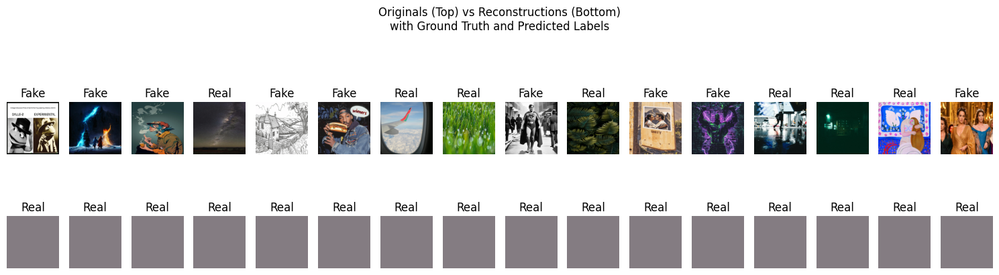

Recon output stats: min=0.488, max=0.523, mean=0.507

Epoch 1/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.1905
 - Recon Loss:   0.2834
 - Class Loss:   0.0290

Epoch 2/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.1897
 - Recon Loss:   0.2820
 - Class Loss:   0.0289

Epoch 3/10
Using Progressive Class Weight: 0.0364
Total Loss:      0.1905
 - Recon Loss:   0.2822
 - Class Loss:   0.0201

Epoch 4/10
Using Progressive Class Weight: 0.0728
Total Loss:      0.1881
 - Recon Loss:   0.2777
 - Class Loss:   0.0184

Epoch 5/10
Using Progressive Class Weight: 0.1092
Total Loss:      0.1867
 - Recon Loss:   0.2742
 - Class Loss:   0.0213

Epoch 6/10
Using Progressive Class Weight: 0.1456
Total Loss:      0.1824
 - Recon Loss:   0.2671
 - Class Loss:   0.0195

Epoch 7/10
Using Progressive Class Weight: 0.1820
Total Loss:      0.1797
 - Recon Loss:   0.2619
 - Class Loss:   0.0196

Epoch 8/10
Using Progressive Class Weight: 0.2184
Total Loss:      0.1784
 - Recon Lo

[I 2025-04-21 21:39:36,732] Trial 3 finished with value: 0.4810126582278481 and parameters: {'alpha_r': 0.5445369002836825, 'beta': 0.1632826475942763, 'gamma_r': 0.5219692971269242, 'gamma_c': 3.591987183704272, 'alpha_c': 0.16540731402740808, 'class_weight': 0.32755778606159336}. Best is trial 1 with value: 0.7102803738317757.
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torchv

Visualizing reconstructions before training starts...


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


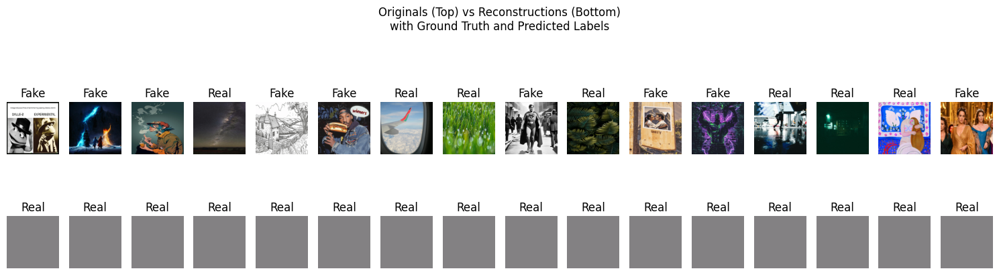

Recon output stats: min=0.504, max=0.520, mean=0.513

Epoch 1/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.2964
 - Recon Loss:   0.4243
 - Class Loss:   0.0116

Epoch 2/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.2958
 - Recon Loss:   0.4234
 - Class Loss:   0.0115

Epoch 3/10
Using Progressive Class Weight: 0.0335
Total Loss:      0.2930
 - Recon Loss:   0.4189
 - Class Loss:   0.0118

Epoch 4/10
Using Progressive Class Weight: 0.0670
Total Loss:      0.2872
 - Recon Loss:   0.4100
 - Class Loss:   0.0115

Epoch 5/10
Using Progressive Class Weight: 0.1005
Total Loss:      0.2699
 - Recon Loss:   0.3847
 - Class Loss:   0.0113

Epoch 6/10
Using Progressive Class Weight: 0.1340
Total Loss:      0.2582
 - Recon Loss:   0.3675
 - Class Loss:   0.0111

Epoch 7/10
Using Progressive Class Weight: 0.1674
Total Loss:      0.2532
 - Recon Loss:   0.3599
 - Class Loss:   0.0108

Epoch 8/10
Using Progressive Class Weight: 0.2009
Total Loss:      0.2475
 - Recon Lo

[I 2025-04-21 21:48:06,995] Trial 4 finished with value: 0.6046511627906976 and parameters: {'alpha_r': 0.6606975015261385, 'beta': 0.17527571107009893, 'gamma_r': 0.8305850746061813, 'gamma_c': 4.90678603971355, 'alpha_c': 0.5181148673232256, 'class_weight': 0.30139932128089775}. Best is trial 1 with value: 0.7102803738317757.
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torchvi

Visualizing reconstructions before training starts...


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


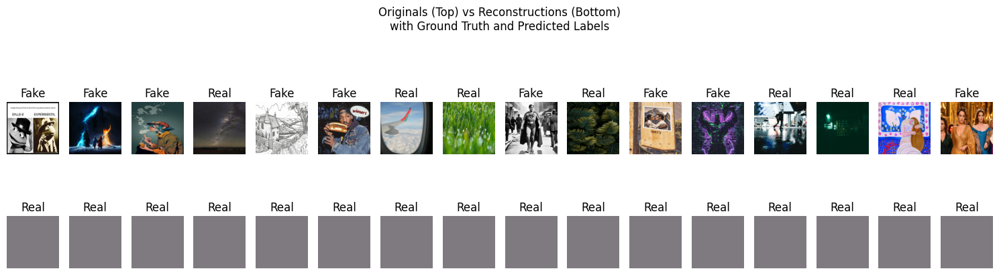

Recon output stats: min=0.479, max=0.507, mean=0.495

Epoch 1/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.5556
 - Recon Loss:   0.6328
 - Class Loss:   0.0203

Epoch 2/10
Using Progressive Class Weight: 0.0000
Total Loss:      0.5266
 - Recon Loss:   0.5998
 - Class Loss:   0.0192

Epoch 3/10
Using Progressive Class Weight: 0.0136
Total Loss:      0.5157
 - Recon Loss:   0.5872
 - Class Loss:   0.0145

Epoch 4/10
Using Progressive Class Weight: 0.0271
Total Loss:      0.4933
 - Recon Loss:   0.5615
 - Class Loss:   0.0139

Epoch 5/10
Using Progressive Class Weight: 0.0407
Total Loss:      0.4763
 - Recon Loss:   0.5418
 - Class Loss:   0.0142

Epoch 6/10
Using Progressive Class Weight: 0.0542
Total Loss:      0.4632
 - Recon Loss:   0.5267
 - Class Loss:   0.0132

Epoch 7/10
Using Progressive Class Weight: 0.0678
Total Loss:      0.4502
 - Recon Loss:   0.5119
 - Class Loss:   0.0126

Epoch 8/10
Using Progressive Class Weight: 0.0814


In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)

20 epochs, 0.1 Sample, 10 tests - 36m

#Setup Best Training Parameters

In [ ]:
#Training Arguments
sample_fraction = 1
epochs = 100
batch_size = 16
lr = 0.0003
weight_decay = 1e-4
freeze_loss = epochs // 10

In [ ]:
# Previous parameters (before Optuna tuning)
prev_params = {
    "alpha_r": 0.84,
    "beta": 0.15,
    "gamma_r": 1.0,
    "gamma_c": 2.0,
    "alpha_c": 0.25,
    "recon_weight": 0.7,
    "class_weight": 0.3
}

# Extract best parameters from Optuna
best_params = study.best_trial.params

# Print comparison
print("\nParameter Comparison:")
for key in best_params:
    prev_val = prev_params.get(key, "N/A")
    new_val = best_params[key]
    changed = "✅ CHANGED" if prev_val != "N/A" and round(prev_val, 4) != round(new_val, 4) else ""
    print(f"  {key}:")
    print(f"    ↪ Previous: {prev_val}")
    print(f"    ↪ New Best: {new_val} {changed}")

# Assign best values to variables for use later
alpha_r = best_params["alpha_r"]
beta     = best_params["beta"]
gamma_r  = best_params["gamma_r"]
gamma_c  = best_params["gamma_c"]
alpha_c  = best_params["alpha_c"]
class_weight  = best_params["class_weight"]
recon_weight  = 1-class_weight

In [ ]:
# Setup dataset
Image.MAX_IMAGE_PIXELS = None
ImageFile.LOAD_TRUNCATED_IMAGES = True

dataset = RealFakeDataset(real_images_path, fake_images_path, transform, sample_fraction = sample_fraction)
total_samples = len(dataset)
print(f"Total number of images in the sampled dataset: {total_samples}")

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size= batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size= batch_size, shuffle=False, num_workers=4)

Total number of images in the sampled dataset: 12006


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


#Run Training

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
No checkpoint found, starting from scratch.
Visualizing reconstructions before training starts...


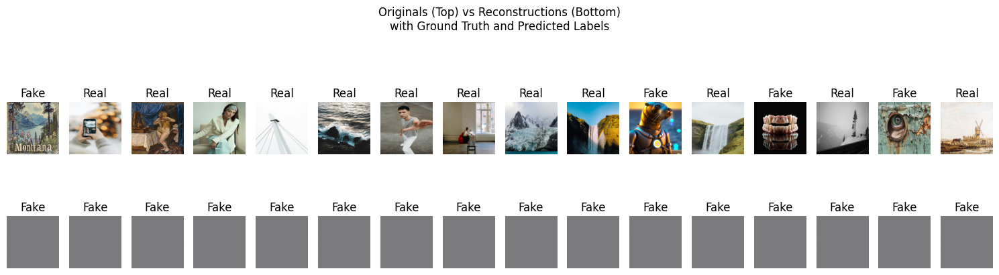

Recon output stats: min=0.476, max=0.491, mean=0.483

Epoch 1/100
Using Progressive Class Weight: 0.0000
Total Loss:      0.3614
 - Recon Loss:   0.5647
 - Class Loss:   0.0403
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_1.pth

Epoch 2/100
Using Progressive Class Weight: 0.0000
Total Loss:      0.2140
 - Recon Loss:   0.3344
 - Class Loss:   0.0404
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_2.pth

Epoch 3/100
Using Progressive Class Weight: 0.0000
Total Loss:      0.1425
 - Recon Loss:   0.2227
 - Class Loss:   0.0404
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_3.pth

Epoch 4/100
Using Progressive Class Weight: 0.0000
Total Loss:      0.1163
 - Recon Loss:   0.1817
 - Class Loss:   0.0404
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_4.pth

Epoch 5/100
Using Progressive Class Weight: 0.0000
Total Loss:      0.1038
 - Recon Lo

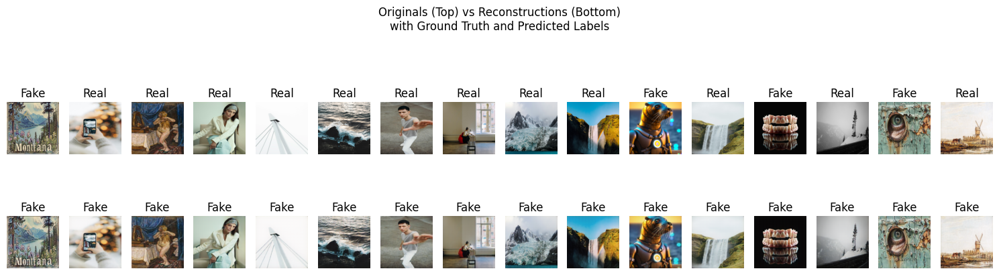

Recon output stats: min=0.008, max=0.994, mean=0.538

Epoch 11/100
Using Progressive Class Weight: 0.0000
Total Loss:      0.0767
 - Recon Loss:   0.1198
 - Class Loss:   0.0404
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_11.pth

Epoch 12/100
Using Progressive Class Weight: 0.0029
Total Loss:      0.0748
 - Recon Loss:   0.1166
 - Class Loss:   0.0402
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_12.pth

Epoch 13/100
Using Progressive Class Weight: 0.0058
Total Loss:      0.0729
 - Recon Loss:   0.1136
 - Class Loss:   0.0392
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_13.pth

Epoch 14/100
Using Progressive Class Weight: 0.0087
Total Loss:      0.0717
 - Recon Loss:   0.1116
 - Class Loss:   0.0362
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_14.pth

Epoch 15/100
Using Progressive Class Weight: 0.0116
Total Loss:      0.0703
 -

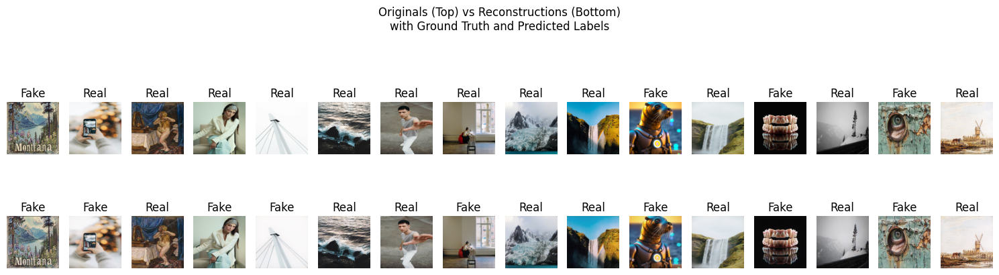

Recon output stats: min=0.008, max=0.992, mean=0.533

Epoch 21/100
Using Progressive Class Weight: 0.0289
Total Loss:      0.0653
 - Recon Loss:   0.1007
 - Class Loss:   0.0302
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_21.pth

Epoch 22/100
Using Progressive Class Weight: 0.0318
Total Loss:      0.0647
 - Recon Loss:   0.0996
 - Class Loss:   0.0298
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_22.pth

Epoch 23/100
Using Progressive Class Weight: 0.0347
Total Loss:      0.0643
 - Recon Loss:   0.0989
 - Class Loss:   0.0295
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_23.pth

Epoch 24/100
Using Progressive Class Weight: 0.0376
Total Loss:      0.0639
 - Recon Loss:   0.0981
 - Class Loss:   0.0292
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_24.pth

Epoch 25/100
Using Progressive Class Weight: 0.0404
Total Loss:      0.0632
 -

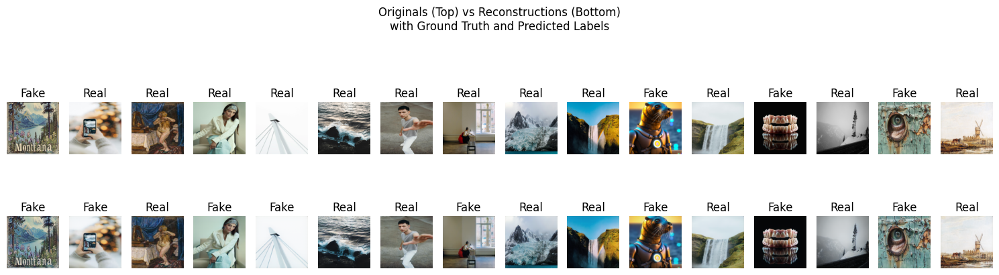

Recon output stats: min=0.008, max=0.987, mean=0.514

Epoch 31/100
Using Progressive Class Weight: 0.0578
Total Loss:      0.0614
 - Recon Loss:   0.0934
 - Class Loss:   0.0275
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_31.pth

Epoch 32/100
Using Progressive Class Weight: 0.0607
Total Loss:      0.0614
 - Recon Loss:   0.0933
 - Class Loss:   0.0274
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_32.pth

Epoch 33/100
Using Progressive Class Weight: 0.0636
Total Loss:      0.0608
 - Recon Loss:   0.0923
 - Class Loss:   0.0275
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_33.pth

Epoch 34/100
Using Progressive Class Weight: 0.0664
Total Loss:      0.0607
 - Recon Loss:   0.0921
 - Class Loss:   0.0270
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_34.pth

Epoch 35/100
Using Progressive Class Weight: 0.0693
Total Loss:      0.0606
 -

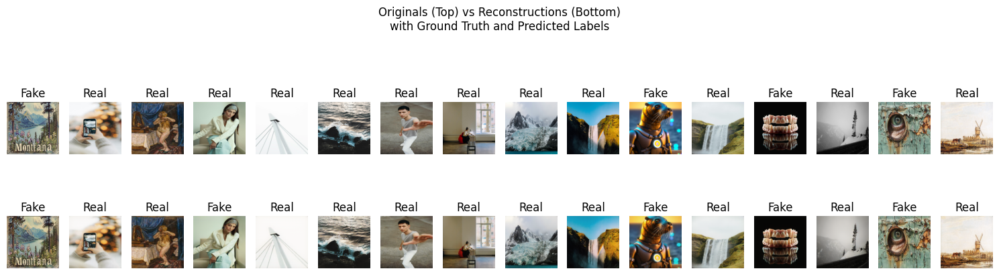

Recon output stats: min=0.010, max=0.992, mean=0.513

Epoch 41/100
Using Progressive Class Weight: 0.0867
Total Loss:      0.0596
 - Recon Loss:   0.0896
 - Class Loss:   0.0262
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_41.pth

Epoch 42/100
Using Progressive Class Weight: 0.0896
Total Loss:      0.0596
 - Recon Loss:   0.0895
 - Class Loss:   0.0259
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_42.pth

Epoch 43/100
Using Progressive Class Weight: 0.0924
Total Loss:      0.0595
 - Recon Loss:   0.0892
 - Class Loss:   0.0259
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_43.pth

Epoch 44/100
Using Progressive Class Weight: 0.0953
Total Loss:      0.0594
 - Recon Loss:   0.0889
 - Class Loss:   0.0260
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_44.pth

Epoch 45/100
Using Progressive Class Weight: 0.0982
Total Loss:      0.0593
 -

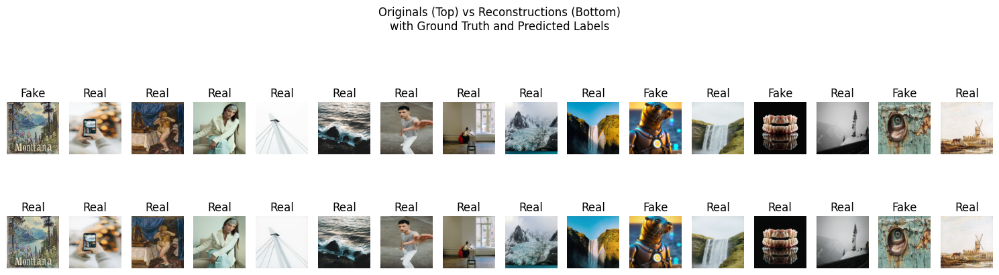

Recon output stats: min=0.014, max=0.992, mean=0.530

Epoch 51/100
Using Progressive Class Weight: 0.1156
Total Loss:      0.0587
 - Recon Loss:   0.0871
 - Class Loss:   0.0252
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_51.pth

Epoch 52/100
Using Progressive Class Weight: 0.1184
Total Loss:      0.0587
 - Recon Loss:   0.0870
 - Class Loss:   0.0259
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_52.pth

Epoch 53/100
Using Progressive Class Weight: 0.1213
Total Loss:      0.0585
 - Recon Loss:   0.0867
 - Class Loss:   0.0253
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_53.pth

Epoch 54/100
Using Progressive Class Weight: 0.1242
Total Loss:      0.0585
 - Recon Loss:   0.0866
 - Class Loss:   0.0252
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_54.pth

Epoch 55/100
Using Progressive Class Weight: 0.1271
Total Loss:      0.0586
 -

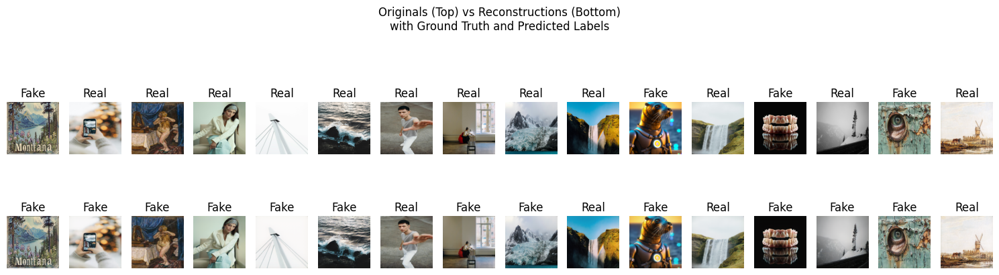

Recon output stats: min=0.011, max=0.991, mean=0.524

Epoch 61/100
Using Progressive Class Weight: 0.1444
Total Loss:      0.0583
 - Recon Loss:   0.0854
 - Class Loss:   0.0250
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_61.pth

Epoch 62/100
Using Progressive Class Weight: 0.1473
Total Loss:      0.0582
 - Recon Loss:   0.0852
 - Class Loss:   0.0252
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_62.pth

Epoch 63/100
Using Progressive Class Weight: 0.1502
Total Loss:      0.0582
 - Recon Loss:   0.0851
 - Class Loss:   0.0248
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_63.pth

Epoch 64/100
Using Progressive Class Weight: 0.1531
Total Loss:      0.0580
 - Recon Loss:   0.0846
 - Class Loss:   0.0248
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_64.pth

Epoch 65/100
Using Progressive Class Weight: 0.1560
Total Loss:      0.0581
 -

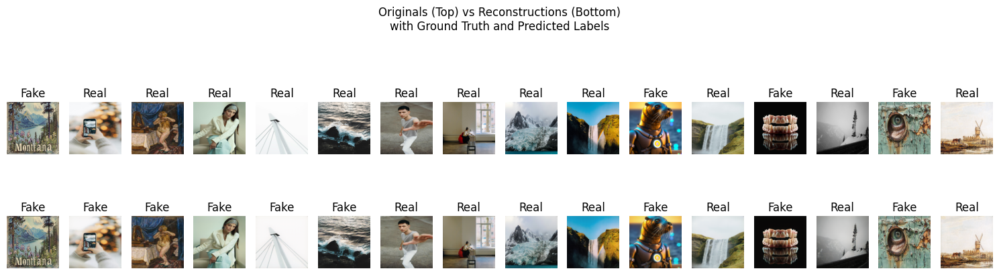

Recon output stats: min=0.014, max=0.989, mean=0.520

Epoch 71/100
Using Progressive Class Weight: 0.1733
Total Loss:      0.0580
 - Recon Loss:   0.0840
 - Class Loss:   0.0244
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_71.pth

Epoch 72/100
Using Progressive Class Weight: 0.1762
Total Loss:      0.0580
 - Recon Loss:   0.0840
 - Class Loss:   0.0244
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_72.pth

Epoch 73/100
Using Progressive Class Weight: 0.1791
Total Loss:      0.0580
 - Recon Loss:   0.0839
 - Class Loss:   0.0241
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_73.pth

Epoch 74/100
Using Progressive Class Weight: 0.1820
Total Loss:      0.0580
 - Recon Loss:   0.0837
 - Class Loss:   0.0241
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_74.pth

Epoch 75/100
Using Progressive Class Weight: 0.1849
Total Loss:      0.0580
 -

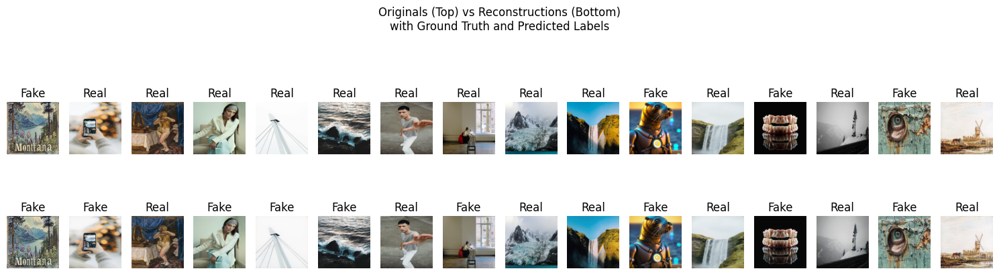

Recon output stats: min=0.013, max=0.988, mean=0.522

Epoch 81/100
Using Progressive Class Weight: 0.2022
Total Loss:      0.0580
 - Recon Loss:   0.0831
 - Class Loss:   0.0239
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_81.pth

Epoch 82/100
Using Progressive Class Weight: 0.2051
Total Loss:      0.0581
 - Recon Loss:   0.0832
 - Class Loss:   0.0235
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_82.pth

Epoch 83/100
Using Progressive Class Weight: 0.2080
Total Loss:      0.0578
 - Recon Loss:   0.0826
 - Class Loss:   0.0237
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_83.pth

Epoch 84/100
Using Progressive Class Weight: 0.2109
Total Loss:      0.0581
 - Recon Loss:   0.0830
 - Class Loss:   0.0237
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_84.pth

Epoch 85/100
Using Progressive Class Weight: 0.2138
Total Loss:      0.0579
 -

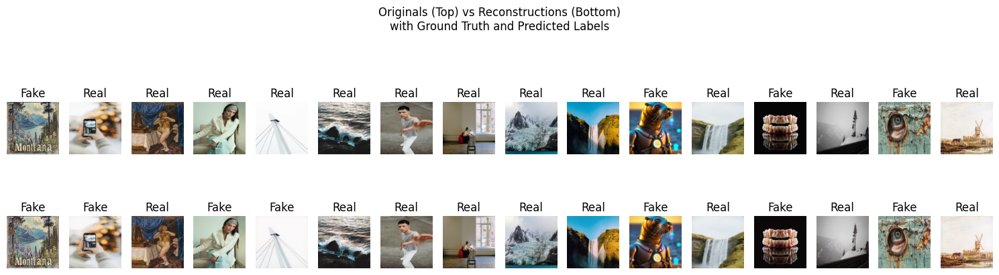

Recon output stats: min=0.016, max=0.993, mean=0.533

Epoch 91/100
Using Progressive Class Weight: 0.2311
Total Loss:      0.0581
 - Recon Loss:   0.0826
 - Class Loss:   0.0230
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_91.pth

Epoch 92/100
Using Progressive Class Weight: 0.2340
Total Loss:      0.0581
 - Recon Loss:   0.0823
 - Class Loss:   0.0229
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_92.pth

Epoch 93/100
Using Progressive Class Weight: 0.2369
Total Loss:      0.0584
 - Recon Loss:   0.0826
 - Class Loss:   0.0231
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_93.pth

Epoch 94/100
Using Progressive Class Weight: 0.2398
Total Loss:      0.0579
 - Recon Loss:   0.0820
 - Class Loss:   0.0227
Checkpoint saved at /content/drive/MyDrive/your_project/checkpoints/checkpoint_epoch_94.pth

Epoch 95/100
Using Progressive Class Weight: 0.2427
Total Loss:      0.0582
 -

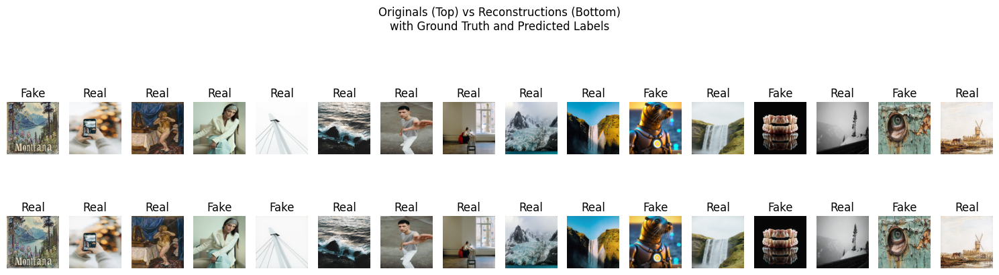

Recon output stats: min=0.010, max=0.989, mean=0.527


In [ ]:
# Instantiate model
model = AutoencoderClassifier(freeze_encoder=True).to('cuda')

# Unfreeze layer 2, 3, 4 from ResNet18 (last three blocks)
for name, module in model.encoder.named_children():
    if name in ['5', '6', '7']:  # layer2 and layer3 and layer 4
        for param in module.parameters():
            param.requires_grad = True

criterion_recon = FullHybridLoss(alpha=alpha_r, beta=beta, gamma=gamma_r)
criterion_class = FocalLoss(gamma=gamma_c, alpha=alpha_c)

optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

train_multitask_model(
    model,
    train_loader,
    criterion_recon,
    criterion_class,
    optimizer,
    recon_weight = recon_weight,
    class_weight = class_weight,
    epochs= epochs,
    freeze_loss = freeze_loss
)

#Architecture Diagram

In [ ]:
def visualize_model_architecture(model):
    dot = Digraph(comment='Model Architecture')

    # Add input node
    dot.node('input', 'Input (3x256x256)')
    last_layer = 'input'

    # Encoder
    for i, layer in enumerate(model.encoder):
        layer_name = f'encoder_{i}'

        if isinstance(layer, nn.Conv2d):
            label = f'Conv2d\n{layer.in_channels}→{layer.out_channels}\nks={layer.kernel_size}, s={layer.stride}'
        elif isinstance(layer, nn.BatchNorm2d):
            label = f'BatchNorm2d\n({layer.num_features})'
        elif isinstance(layer, nn.ReLU):
            label = 'ReLU'
        elif isinstance(layer, nn.MaxPool2d):
            label = f'MaxPool2d\nks={layer.kernel_size}, s={layer.stride}'
        else:
            label = layer.__class__.__name__

        dot.node(layer_name, label)
        dot.edge(last_layer, layer_name)
        last_layer = layer_name

    # Bottleneck
    dot.node('bottleneck', 'Encoded\n(256x16x16)')
    dot.edge(last_layer, 'bottleneck')

    # Decoder
    last_layer = 'bottleneck'
    for i, layer in enumerate(model.decoder):
        layer_name = f'decoder_{i}'

        if isinstance(layer, nn.ConvTranspose2d):
            label = f'ConvT2d\n{layer.in_channels}→{layer.out_channels}\nks={layer.kernel_size}, s={layer.stride}'
        elif isinstance(layer, nn.Conv2d):
            label = f'Conv2d\n{layer.in_channels}→{layer.out_channels}\nks={layer.kernel_size}'
        elif isinstance(layer, nn.ReLU):
            label = 'ReLU'
        elif isinstance(layer, nn.Sigmoid):
            label = 'Sigmoid'
        else:
            label = layer.__class__.__name__

        dot.node(layer_name, label)
        dot.edge(last_layer, layer_name)
        last_layer = layer_name

    dot.node('output_recon', 'Output\nReconstruction (3x256x256)')
    dot.edge(last_layer, 'output_recon')

    # Classifier
    last_layer = 'bottleneck'
    for i, layer in enumerate(model.classifier):
        layer_name = f'classifier_{i}'

        if isinstance(layer, nn.AdaptiveAvgPool2d):
            label = f'AdaptiveAvgPool2d\n({layer.output_size})'
        elif isinstance(layer, nn.Flatten):
            label = 'Flatten'
        elif isinstance(layer, nn.Linear):
            label = f'Linear\n{layer.in_features}→{layer.out_features}'
        elif isinstance(layer, nn.ReLU):
            label = 'ReLU'
        elif isinstance(layer, nn.Sigmoid):
            label = 'Sigmoid'
        else:
            label = layer.__class__.__name__

        dot.node(layer_name, label)
        dot.edge(last_layer, layer_name)
        last_layer = layer_name

    dot.node('output_class', 'Output\nClassification (1)')
    dot.edge(last_layer, 'output_class')

    return dot

model_architecture = visualize_model_architecture(model)
display(model_architecture)


#Evaluate Model On Test Set

Classification Report on Test Set
Accuracy:  0.8514
Precision: 0.8969
Recall:    0.7926
F1 Score:  0.8415


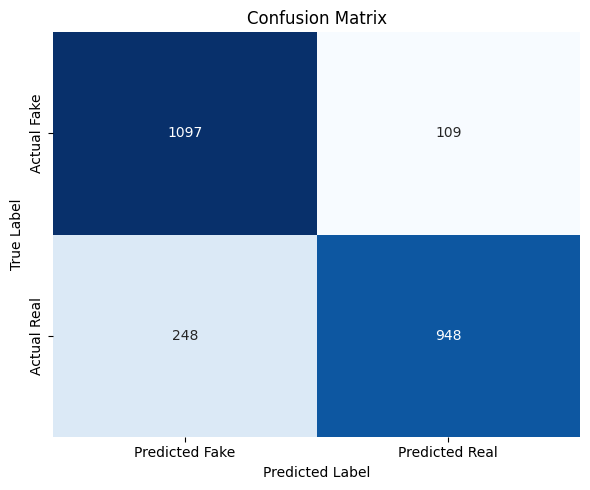

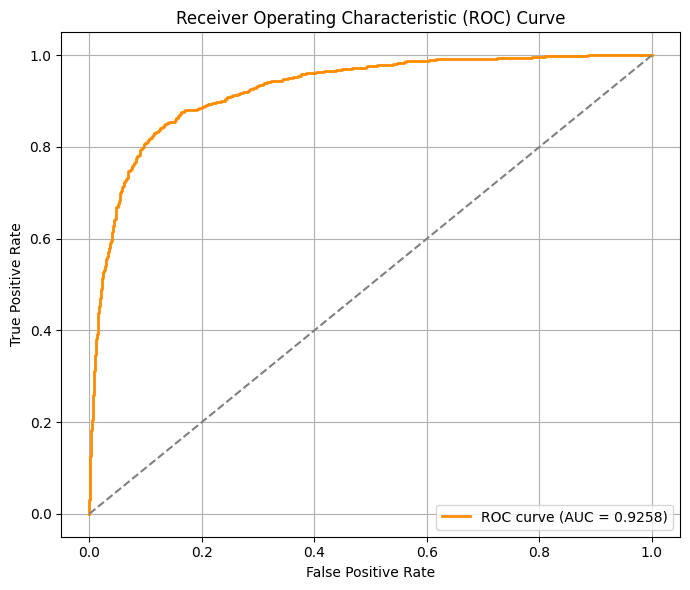

In [ ]:
def evaluate_model_on_test(model, test_loader, threshold=0.5):
    model.eval()
    device = next(model.parameters()).device
    all_preds = []
    all_probs = []
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            _, outputs = model(images)
            probs = outputs.view(-1)

            preds = (probs > threshold).float()

            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_preds = np.array(all_preds)
    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Metrics
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds)
    rec = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    cm = confusion_matrix(all_labels, all_preds)

    print("Classification Report on Test Set")
    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall:    {rec:.4f}")
    print(f"F1 Score:  {f1:.4f}")

    # --- Confusion Matrix ---
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=["Predicted Fake", "Predicted Real"],
                yticklabels=["Actual Fake", "Actual Real"])
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()

    # --- ROC Curve ---
    fpr, tpr, thresholds = roc_curve(all_labels, all_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (AUC = {roc_auc:.4f})")
    plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic (ROC) Curve")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

evaluate_model_on_test(model, test_loader, threshold = threshold)

#Confidence Distribution

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


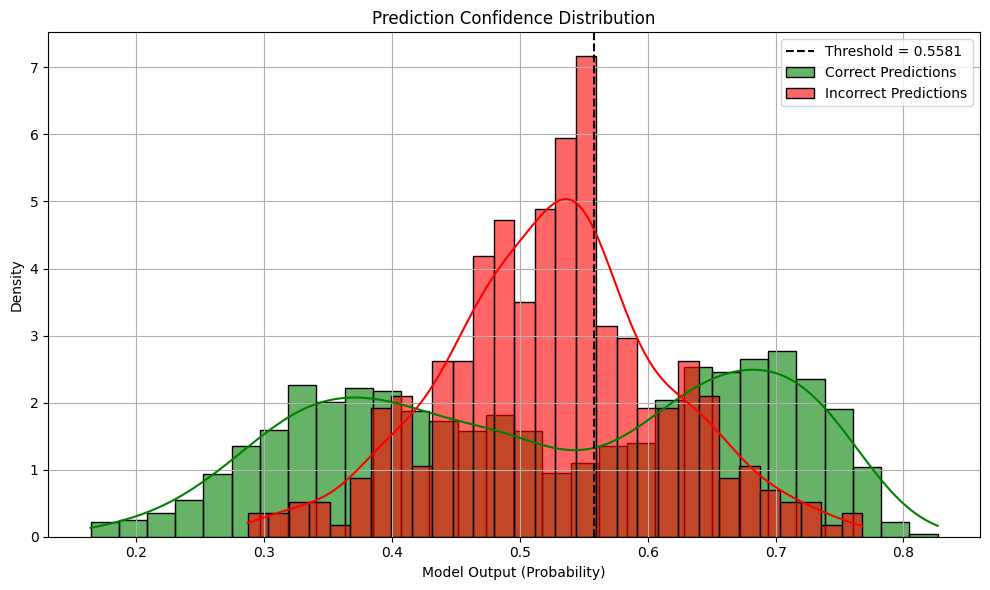

In [ ]:
def plot_prediction_confidence_distribution(model, test_loader, threshold=0.5):
    model.eval()
    device = next(model.parameters()).device
    all_labels = []
    all_preds = []
    all_probs = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            _, outputs = model(images)
            probs = outputs.view(-1)

            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_preds.extend((probs > threshold).float().cpu().numpy())

    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    all_preds = np.array(all_preds)

    correct_mask = (all_preds == all_labels)
    incorrect_mask = ~correct_mask

    plt.figure(figsize=(10, 6))
    sns.histplot(all_probs[correct_mask], bins=30, color="green", label="Correct Predictions", kde=True, stat="density", alpha=0.6)
    sns.histplot(all_probs[incorrect_mask], bins=30, color="red", label="Incorrect Predictions", kde=True, stat="density", alpha=0.6)

    plt.axvline(x=threshold, color="black", linestyle="--", label=f"Threshold = {threshold}")
    plt.title("Prediction Confidence Distribution")
    plt.xlabel("Model Output (Probability)")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_prediction_confidence_distribution(model, test_loader, threshold = threshold)

#Youden Threshold

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


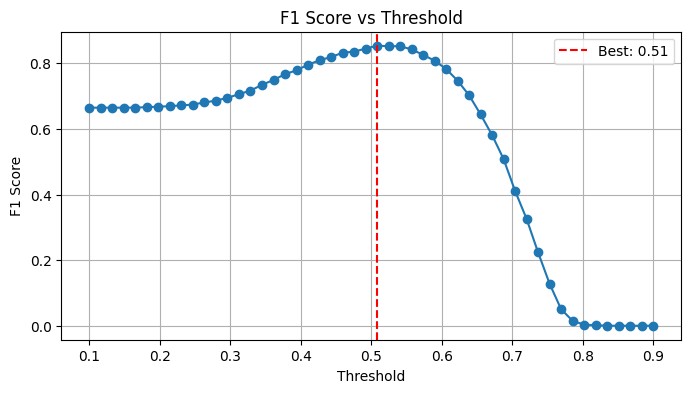

🧠 Best F1 threshold: 0.5082
📌 Best threshold by Youden's J: 0.5341


In [ ]:
def get_preds_and_labels(model, dataloader, device='cuda'):
    model.eval()
    preds = []
    labels = []
    with torch.no_grad():
        for imgs, lbls in dataloader:
            imgs = imgs.to(device)
            lbls = lbls.to(device)
            _, out = model(imgs)
            preds.extend(out.view(-1).cpu().numpy())
            labels.extend(lbls.cpu().numpy())
    return np.array(preds), np.array(labels)

def plot_f1_by_threshold(preds, labels):
    thresholds = np.linspace(0.1, 0.9, 50)
    f1s = [f1_score(labels, preds > t) for t in thresholds]

    plt.figure(figsize=(8, 4))
    plt.plot(thresholds, f1s, marker='o')
    plt.title("F1 Score vs Threshold")
    plt.xlabel("Threshold")
    plt.ylabel("F1 Score")
    plt.grid(True)
    best_t = thresholds[np.argmax(f1s)]
    plt.axvline(best_t, color='red', linestyle='--', label=f'Best: {best_t:.2f}')
    plt.legend()
    plt.show()

    print(f"🧠 Best F1 threshold: {best_t:.4f}")

def find_best_threshold_roc(preds, labels):
    fpr, tpr, thresholds = roc_curve(labels, preds)
    j_scores = tpr - fpr
    best_idx = np.argmax(j_scores)
    best_threshold = thresholds[best_idx]
    print(f"📌 Best threshold by Youden's J: {best_threshold:.4f}")
    return best_threshold

preds, labels = get_preds_and_labels(model, test_loader)

# Plot
plot_f1_by_threshold(preds, labels)

# Best threshold
best_thresh = find_best_threshold_roc(preds, labels)


#Visualize Misclassified Images

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


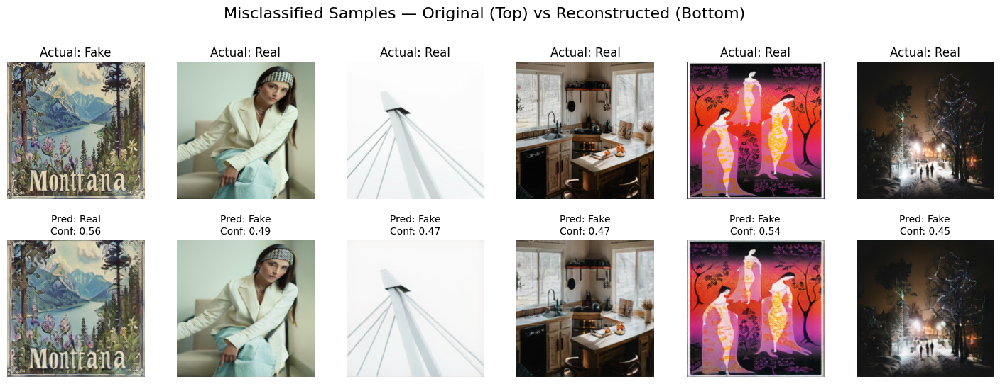

In [ ]:
def visualize_misclassified_samples(model, test_loader, threshold=0.5, max_to_show=5):
    model.eval()
    device = next(model.parameters()).device

    misclassified_images = []
    misclassified_recons = []
    misclassified_labels = []
    misclassified_preds = []
    misclassified_conf = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            recons, preds = model(images)
            preds = preds.view(-1)
            preds_binary = (preds >= threshold).float()

            mismatches = preds_binary != labels
            if mismatches.sum().item() == 0:
                continue

            for i in range(images.size(0)):
                if mismatches[i]:
                    misclassified_images.append(images[i].cpu())
                    misclassified_recons.append(recons[i].cpu())
                    misclassified_labels.append(int(labels[i].cpu()))
                    misclassified_preds.append(int(preds_binary[i].cpu()))
                    misclassified_conf.append(float(preds[i].cpu()))

                    if len(misclassified_images) >= max_to_show:
                        break
            if len(misclassified_images) >= max_to_show:
                break

    if len(misclassified_images) == 0:
        print("✅ No misclassified samples found in the test set!")
        return

    # Denormalize originals
    misclassified_images = [unnormalize(img.unsqueeze(0), IMAGENET_MEAN, IMAGENET_STD).squeeze(0) for img in misclassified_images]
    misclassified_images = [torch.clamp(img, 0.0, 1.0) for img in misclassified_images]
    misclassified_recons = [torch.clamp(recon, 0.0, 1.0) for recon in misclassified_recons]

    # Convert to numpy
    misclassified_images = [img.permute(1, 2, 0).numpy() for img in misclassified_images]
    misclassified_recons = [recon.permute(1, 2, 0).numpy() for recon in misclassified_recons]

    fig, axes = plt.subplots(2, len(misclassified_images), figsize=(3 * len(misclassified_images), 6))
    if len(misclassified_images) == 1:
        axes = axes.reshape(2, 1)

    for i in range(len(misclassified_images)):
        gt = "Real" if misclassified_labels[i] == 1 else "Fake"
        pred = "Real" if misclassified_preds[i] == 1 else "Fake"
        conf = misclassified_conf[i]

        # Top: original
        axes[0, i].imshow(misclassified_images[i])
        axes[0, i].axis('off')
        axes[0, i].set_title(f"Actual: {gt}")

        # Bottom: reconstructed + confidence bar
        axes[1, i].imshow(misclassified_recons[i])
        axes[1, i].axis('off')
        axes[1, i].set_title(f"Pred: {pred}", fontsize=10)

        # Add numerical confidence score as subtitle
        axes[1, i].set_title(f"Pred: {pred}\nConf: {conf:.2f}", fontsize=10)


    plt.suptitle("Misclassified Samples — Original (Top) vs Reconstructed (Bottom)", fontsize=16)
    plt.subplots_adjust(hspace=0.3, top=0.85)
    plt.show()

visualize_misclassified_samples(model, test_loader, threshold = threshold, max_to_show=6)

#Save Model

In [ ]:
# Save to a permanent location in your Google Drive
save_path = '/content/drive/MyDrive/autoencoder_classifier.pth'
torch.save(model.state_dict(), save_path)